# 评估AFNONet结合4DVar同化方法的预报技巧


In [55]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 基本参数设置

In [139]:
# Depending on your combination of package versions, this can raise a lot of TF warnings... 

import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
# import torch
# import seaborn as sns
from pathlib import Path
import pickle
import sys 
sys.path.append('../')
from src.utils.score import *
from src.utils.plot import plot_iter_result, plot_increment, subplot_spinup, subplot_increment, subplot_daloop, subplot_field
from src.utils.spectral_density import compute_mean_spectral_density, plot_psd, cvae_compute_mean_spectral_density, subplot_psd

读取4DVar的分析预报循环数据

In [57]:
data_dir = '../../../data/' #_2.8125deg'
var4d_dir = '../../output/spin_up_pred/4dvar'
# var3d_dir = '/public/home/wangwuxing01/research/weatherbench/results/spin_up/5.625deg_obserr0.015mean/dt_obs6/3dvar'
cgan_dir = '../../output/spin_up_pred/4dvargan_60wl1_0806'
# cyclegan_dir = '../../output/da_loop/cyclegan'
# mlp_dir = '/public/home/wangwuxing01/research/4dvar-segan/results/spin_up/5.625deg_obserr0.015mean/mlp'
resnet_dir = '../../output/spin_up_pred/resnet'
vit_dir = '../../output/spin_up_pred/vit_0804'
fdvarnet_dir = '../../output/spin_up_pred/4dvarnet_0804_'

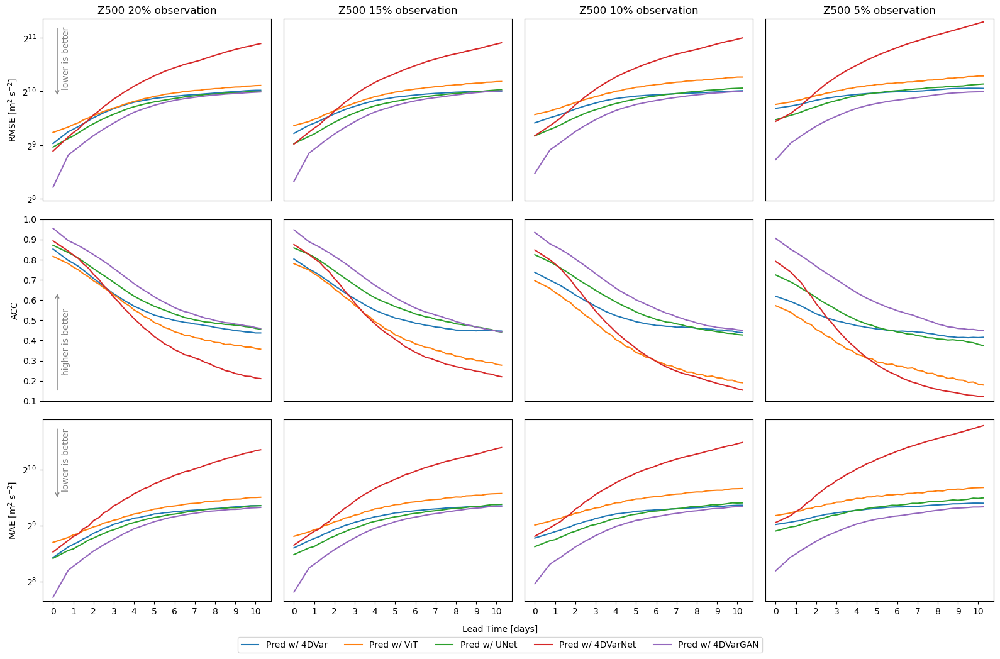

In [58]:
xr_4dvar, xr_3dvar, xr_cgan, xr_cyclegan, xr_mlp, xr_resnet, xr_4dvarnet, xr_vit, xr_era5 = [], [], [], [], [], [], [], [], []

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_rmse_4dvar = xr.open_mfdataset(f'{var4d_dir}/rmse_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_3dvar = xr.open_mfdataset(f'{var3d_dir}/rmse_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_cgan = xr.open_mfdataset(f'{cgan_dir}/rmse_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/rmse_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_mlp = xr.open_mfdataset(f'{mlp_dir}/rmse_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_resnet = xr.open_mfdataset(f'{resnet_dir}/rmse_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/rmse_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_vit = xr.open_mfdataset(f'{vit_dir}/rmse_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_rmse_4dvar)
    # xr_3dvar.append(xr_rmse_3dvar)
    xr_cgan.append(xr_rmse_cgan)
    # xr_cyclegan.append(xr_rmse_cyclegan)
    # xr_mlp.append(xr_rmse_mlp)
    xr_resnet.append(xr_rmse_resnet)
    xr_4dvarnet.append(xr_rmse_4dvarnet)
    xr_vit.append(xr_rmse_vit)

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_acc_4dvar = xr.open_mfdataset(f'{var4d_dir}/acc_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_3dvar = xr.open_mfdataset(f'{var3d_dir}/acc_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_cgan = xr.open_mfdataset(f'{cgan_dir}/acc_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/acc_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_mlp = xr.open_mfdataset(f'{mlp_dir}/acc_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_resnet = xr.open_mfdataset(f'{resnet_dir}/acc_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/acc_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_vit = xr.open_mfdataset(f'{vit_dir}/acc_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_acc_4dvar)
    # xr_3dvar.append(xr_acc_3dvar)
    xr_cgan.append(xr_acc_cgan)
    # xr_cyclegan.append(xr_acc_cyclegan)
    # xr_mlp.append(xr_acc_mlp)
    xr_resnet.append(xr_acc_resnet)
    xr_4dvarnet.append(xr_acc_4dvarnet)
    xr_vit.append(xr_acc_vit)

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_mae_4dvar = xr.open_mfdataset( f'{var4d_dir}/mae_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_3dvar = xr.open_mfdataset( f'{var3d_dir}/mae_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_cgan = xr.open_mfdataset(f'{cgan_dir}/mae_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/mae_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_mlp = xr.open_mfdataset(f'{mlp_dir}/mae_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_resnet = xr.open_mfdataset(f'{resnet_dir}/mae_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/mae_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_vit = xr.open_mfdataset(f'{vit_dir}/mae_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_mae_4dvar)
    # xr_3dvar.append(xr_mae_3dvar)
    xr_cgan.append(xr_mae_cgan)
    # xr_cyclegan.append(xr_mae_cyclegan)
    # xr_mlp.append(xr_mae_mlp)
    xr_resnet.append(xr_mae_resnet)
    xr_4dvarnet.append(xr_mae_4dvarnet)
    xr_vit.append(xr_mae_vit)

subplot_spinup([xr_4dvar, xr_vit, xr_resnet, xr_4dvarnet, xr_cgan],
               ['4DVar', 'ViT', 'UNet', '4DVarNet', '4DVarGAN'],
                ['20%', '15%', '10%', '5%'], 
               'z',
                'Lead Time', 
                ['RMSE', 'ACC', 'MAE'], 
                'Z500', 
                ' [days]', 
                [' [m$^2$ s$^{-2}$]', '', ' [m$^2$ s$^{-2}$]'], 
                5*24,
                10*24,
                5,
                0,
                'spin_up_pred')

In [59]:
print('20% RMSE 3days', xr_4dvar[0]['z'][20+12].values, xr_4dvarnet[0]['z'][20+12].values, xr_resnet[0]['z'][20+12].values, xr_vit[0]['z'][20+12].values, xr_cgan[0]['z'][20+12].values)
print('15% RMSE 3days', xr_4dvar[1]['z'][20+12].values, xr_4dvarnet[1]['z'][20+12].values, xr_resnet[1]['z'][20+12].values, xr_vit[1]['z'][20+12].values, xr_cgan[1]['z'][20+12].values)
print('10% RMSE 3days', xr_4dvar[2]['z'][20+12].values, xr_4dvarnet[2]['z'][20+12].values, xr_resnet[2]['z'][20+12].values, xr_vit[2]['z'][20+12].values, xr_cgan[2]['z'][20+12].values)
print('5% RMSE 3days', xr_4dvar[3]['z'][20+12].values, xr_4dvarnet[3]['z'][20+12].values, xr_resnet[3]['z'][20+12].values, xr_vit[3]['z'][20+12].values, xr_cgan[3]['z'][20+12].values)

20% RMSE 3days 857.1066 1011.77026 803.5541 865.25616 732.8571
15% RMSE 3days 878.0735 1068.2637 814.8727 921.5328 740.38983
10% RMSE 3days 909.67505 1143.3289 843.37213 994.25586 757.3475
5% RMSE 3days 970.4903 1339.0311 941.3835 1058.7087 784.56433


In [60]:
print('20% RMSE 5days', xr_4dvar[0]['z'][20+20].values, xr_4dvarnet[0]['z'][20+20].values, xr_resnet[0]['z'][20+20].values, xr_vit[0]['z'][20+20].values, xr_cgan[0]['z'][20+20].values)
print('15% RMSE 5days', xr_4dvar[1]['z'][20+20].values, xr_4dvarnet[1]['z'][20+20].values, xr_resnet[1]['z'][20+20].values, xr_vit[1]['z'][20+20].values, xr_cgan[1]['z'][20+20].values)
print('10% RMSE 5days', xr_4dvar[2]['z'][20+20].values, xr_4dvarnet[2]['z'][20+20].values, xr_resnet[2]['z'][20+20].values, xr_vit[2]['z'][20+20].values, xr_cgan[2]['z'][20+20].values)
print('5% RMSE 5days', xr_4dvar[3]['z'][20+20].values, xr_4dvarnet[3]['z'][20+20].values, xr_resnet[3]['z'][20+20].values, xr_vit[3]['z'][20+20].values, xr_cgan[3]['z'][20+20].values)

20% RMSE 5days 948.81976 1324.8353 914.11115 984.8664 885.064
15% RMSE 5days 962.4478 1363.1594 921.5204 1037.438 880.68774
10% RMSE 5days 972.1213 1458.7263 948.8613 1100.8467 888.12933
5% RMSE 5days 1012.3947 1712.2607 1022.1982 1133.5896 897.30133


In [61]:
print('20% ACC 3days', xr_4dvar[4]['z'][20+12].values, xr_4dvarnet[4]['z'][20+12].values, xr_resnet[4]['z'][20+12].values, xr_vit[4]['z'][20+12].values, xr_cgan[4]['z'][20+12].values)
print('15% ACC 3days', xr_4dvar[5]['z'][20+12].values, xr_4dvarnet[5]['z'][20+12].values, xr_resnet[5]['z'][20+12].values, xr_vit[5]['z'][20+12].values, xr_cgan[5]['z'][20+12].values)
print('10% ACC 3days', xr_4dvar[6]['z'][20+12].values, xr_4dvarnet[6]['z'][20+12].values, xr_resnet[6]['z'][20+12].values, xr_vit[6]['z'][20+12].values, xr_cgan[6]['z'][20+12].values)
print('5% ACC 3days', xr_4dvar[7]['z'][20+12].values, xr_4dvarnet[7]['z'][20+12].values, xr_resnet[7]['z'][20+12].values, xr_vit[7]['z'][20+12].values, xr_cgan[7]['z'][20+12].values)

20% ACC 3days 0.598707 0.55913854 0.65252477 0.587505 0.71879095
15% ACC 3days 0.5766797 0.52876794 0.6410427 0.532017 0.7092606
10% ACC 3days 0.5433731 0.49054512 0.61868864 0.44193813 0.69408536
5% ACC 3days 0.48457363 0.40321687 0.5240477 0.3578416 0.6679017


In [62]:
print('20% ACC 5days', xr_4dvar[4]['z'][20+20].values, xr_4dvarnet[4]['z'][20+20].values, xr_resnet[4]['z'][20+20].values, xr_vit[4]['z'][20+20].values, xr_cgan[4]['z'][20+20].values)
print('15% ACC 5days', xr_4dvar[5]['z'][20+20].values, xr_4dvarnet[5]['z'][20+20].values, xr_resnet[5]['z'][20+20].values, xr_vit[5]['z'][20+20].values, xr_cgan[5]['z'][20+20].values)
print('10% ACC 5days', xr_4dvar[6]['z'][20+20].values, xr_4dvarnet[6]['z'][20+20].values, xr_resnet[6]['z'][20+20].values, xr_vit[6]['z'][20+20].values, xr_cgan[6]['z'][20+20].values)
print('5% ACC 5days', xr_4dvar[7]['z'][20+20].values, xr_4dvarnet[7]['z'][20+20].values, xr_resnet[7]['z'][20+20].values, xr_vit[7]['z'][20+20].values, xr_cgan[7]['z'][20+20].values)

20% ACC 5days 0.5118281 0.38311902 0.54987186 0.46442074 0.58834255
15% ACC 5days 0.4986399 0.36812916 0.5493259 0.40310547 0.58476925
10% ACC 5days 0.48231313 0.3248519 0.5206179 0.3165958 0.5784162
5% ACC 5days 0.4507467 0.24926236 0.45211592 0.2807268 0.564885


In [63]:
print('20% MAE 3days', xr_4dvar[8]['z'][20+12].values, xr_4dvarnet[8]['z'][20+12].values, xr_resnet[8]['z'][20+12].values, xr_vit[8]['z'][20+12].values, xr_cgan[8]['z'][20+12].values)
print('15% MAE 3days', xr_4dvar[9]['z'][20+12].values, xr_4dvarnet[9]['z'][20+12].values, xr_resnet[9]['z'][20+12].values, xr_vit[9]['z'][20+12].values, xr_cgan[9]['z'][20+12].values)
print('10% MAE 3days', xr_4dvar[10]['z'][20+12].values, xr_4dvarnet[10]['z'][20+12].values, xr_resnet[10]['z'][20+12].values, xr_vit[10]['z'][20+12].values, xr_cgan[10]['z'][20+12].values)
print('5% MAE 3days', xr_4dvar[11]['z'][20+12].values, xr_4dvarnet[11]['z'][20+12].values, xr_resnet[11]['z'][20+12].values, xr_vit[11]['z'][20+12].values, xr_cgan[11]['z'][20+12].values)

20% MAE 3days 541.14355 705.2908 508.95367 570.2199 462.49576
15% MAE 3days 552.03235 754.56396 517.4703 606.89044 468.2507
10% MAE 3days 576.21454 809.8299 538.433 658.7881 479.35025
5% MAE 3days 610.10547 962.2832 601.7365 700.9661 498.32407


In [64]:
print('20% MAE 5days', xr_4dvar[8]['z'][20+20].values, xr_4dvarnet[8]['z'][20+20].values, xr_resnet[8]['z'][20+20].values, xr_vit[8]['z'][20+20].values, xr_cgan[8]['z'][20+20].values)
print('15% MAE 5days', xr_4dvar[9]['z'][20+20].values, xr_4dvarnet[9]['z'][20+20].values, xr_resnet[9]['z'][20+20].values, xr_vit[9]['z'][20+20].values, xr_cgan[9]['z'][20+20].values)
print('10% MAE 5days', xr_4dvar[10]['z'][20+20].values, xr_4dvarnet[10]['z'][20+20].values, xr_resnet[10]['z'][20+20].values, xr_vit[10]['z'][20+20].values, xr_cgan[10]['z'][20+20].values)
print('5% MAE 5days', xr_4dvar[11]['z'][20+20].values, xr_4dvarnet[11]['z'][20+20].values, xr_resnet[11]['z'][20+20].values, xr_vit[11]['z'][20+20].values, xr_cgan[11]['z'][20+20].values)

20% MAE 5days 599.4487 907.37585 578.0239 641.8157 555.1327
15% MAE 5days 606.7087 960.5077 582.2768 675.33765 554.029
10% MAE 5days 616.35144 1027.7963 602.4942 722.8594 558.1723
5% MAE 5days 640.5837 1224.9834 651.55426 747.91425 565.6805


In [65]:
data_dir = '../../../data/' #_2.8125deg'
var4d_dir = '../../output/da_loop/4dvar'
# var3d_dir = '/public/home/wangwuxing01/research/weatherbench/results/spin_up/5.625deg_obserr0.015mean/dt_obs6/3dvar'
cgan_dir = '../../output/da_loop/4dvargan'
# cyclegan_dir = '../../output/da_loop/cyclegan'
# mlp_dir = '/public/home/wangwuxing01/research/4dvar-segan/results/spin_up/5.625deg_obserr0.015mean/mlp'
resnet_dir = '../../output/da_loop/resnet'
vit_dir = '../../output/da_loop/vit'
fdvarnet_dir = '../../output/da_loop/4dvarnet'

/mnt/d/Study/Lab/work/idea3/code/openi/4DVarGAN/notebooks/../src/utils/plot.py:273: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


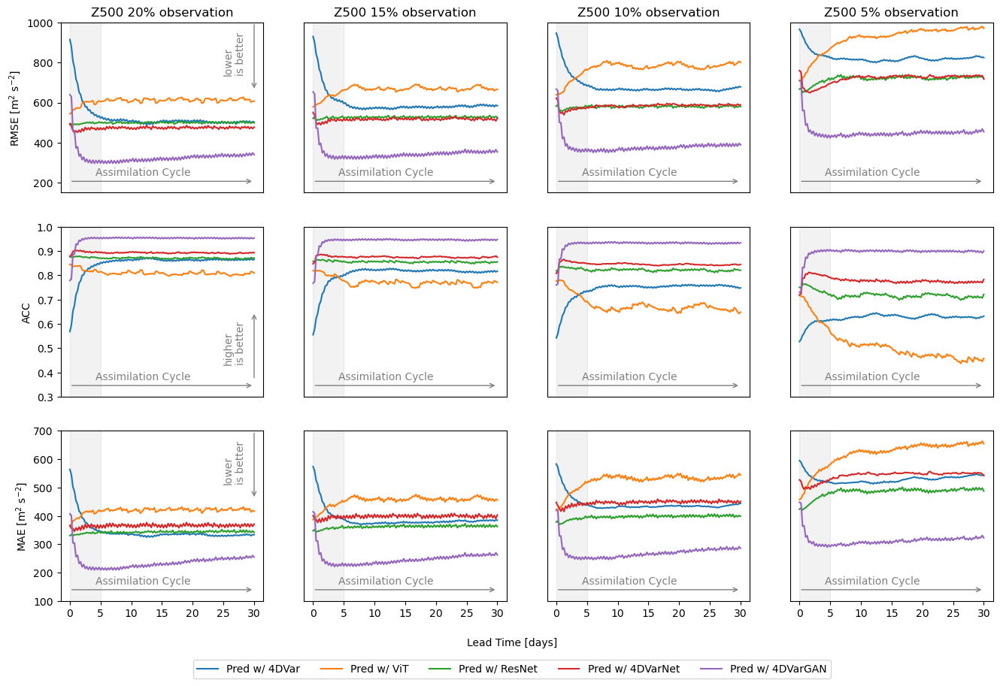

In [66]:
xr_4dvar, xr_3dvar, xr_cgan, xr_cyclegan, xr_mlp, xr_resnet, xr_4dvarnet, xr_vit, xr_era5 = [], [], [], [], [], [], [], [], []

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_rmse_4dvar = xr.open_mfdataset(f'{var4d_dir}/rmse_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_3dvar = xr.open_mfdataset(f'{var3d_dir}/rmse_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_cgan = xr.open_mfdataset(f'{cgan_dir}/rmse_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/rmse_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_rmse_mlp = xr.open_mfdataset(f'{mlp_dir}/rmse_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_resnet = xr.open_mfdataset(f'{resnet_dir}/rmse_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/rmse_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_rmse_vit = xr.open_mfdataset(f'{vit_dir}/rmse_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_rmse_4dvar)
    # xr_3dvar.append(xr_rmse_3dvar)
    xr_cgan.append(xr_rmse_cgan)
    # xr_cyclegan.append(xr_rmse_cyclegan)
    # xr_mlp.append(xr_rmse_mlp)
    xr_resnet.append(xr_rmse_resnet)
    xr_4dvarnet.append(xr_rmse_4dvarnet)
    xr_vit.append(xr_rmse_vit)

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_acc_4dvar = xr.open_mfdataset(f'{var4d_dir}/acc_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_3dvar = xr.open_mfdataset(f'{var3d_dir}/acc_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_cgan = xr.open_mfdataset(f'{cgan_dir}/acc_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/acc_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_acc_mlp = xr.open_mfdataset(f'{mlp_dir}/acc_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_resnet = xr.open_mfdataset(f'{resnet_dir}/acc_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/acc_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_acc_vit = xr.open_mfdataset(f'{vit_dir}/acc_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_acc_4dvar)
    # xr_3dvar.append(xr_acc_3dvar)
    xr_cgan.append(xr_acc_cgan)
    # xr_cyclegan.append(xr_acc_cyclegan)
    # xr_mlp.append(xr_acc_mlp)
    xr_resnet.append(xr_acc_resnet)
    xr_4dvarnet.append(xr_acc_4dvarnet)
    xr_vit.append(xr_acc_vit)

for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_mae_4dvar = xr.open_mfdataset( f'{var4d_dir}/mae_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_3dvar = xr.open_mfdataset( f'{var3d_dir}/mae_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_cgan = xr.open_mfdataset(f'{cgan_dir}/mae_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/mae_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    # xr_mae_mlp = xr.open_mfdataset(f'{mlp_dir}/mae_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_resnet = xr.open_mfdataset(f'{resnet_dir}/mae_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/mae_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_mae_vit = xr.open_mfdataset(f'{vit_dir}/mae_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xr_4dvar.append(xr_mae_4dvar)
    # xr_3dvar.append(xr_mae_3dvar)
    xr_cgan.append(xr_mae_cgan)
    # xr_cyclegan.append(xr_mae_cyclegan)
    # xr_mlp.append(xr_mae_mlp)
    xr_resnet.append(xr_mae_resnet)
    xr_4dvarnet.append(xr_mae_4dvarnet)
    xr_vit.append(xr_mae_vit)

subplot_daloop([xr_4dvar, xr_vit, xr_resnet, xr_4dvarnet, xr_cgan],
               ['4DVar', 'ViT', 'UNet', '4DVarNet', '4DVarGAN'],
               ['20%', '15%', '10%', '5%'],
                'z', 
                'Lead Time', 
                ['RMSE', 'ACC', 'MAE'], 
                'Z500', 
                ' [days]', 
                [' [m$^2$ s$^{-2}$]', '', ' [m$^2$ s$^{-2}$]'], 
                5*24,
                25*24,
                5,
                'da_loop')

In [67]:
print('20% RMSE Cycle', xr_4dvar[0]['z'][20:].values.mean(), xr_4dvarnet[0]['z'][20:].values.mean(), xr_resnet[0]['z'][20:].values.mean(), xr_vit[0]['z'][20:].values.mean(), xr_cgan[0]['z'][20:].values.mean())
print('15% RMSE Cycle', xr_4dvar[1]['z'][20:].values.mean(), xr_4dvarnet[1]['z'][20:].values.mean(), xr_resnet[1]['z'][20:].values.mean(), xr_vit[1]['z'][20:].values.mean(), xr_cgan[1]['z'][20:].values.mean())
print('10% RMSE Cycle', xr_4dvar[2]['z'][20:].values.mean(), xr_4dvarnet[2]['z'][20:].values.mean(), xr_resnet[2]['z'][20:].values.mean(), xr_vit[2]['z'][20:].values.mean(), xr_cgan[2]['z'][20:].values.mean())
print('5% RMSE Cycle', xr_4dvar[3]['z'][20:].values.mean(), xr_4dvarnet[3]['z'][20:].values.mean(), xr_resnet[3]['z'][20:].values.mean(), xr_vit[3]['z'][20:].values.mean(), xr_cgan[3]['z'][20:].values.mean())

20% RMSE Cycle 505.59534 474.43143 499.974 612.9637 322.14618
15% RMSE Cycle 578.1243 517.69855 527.2631 670.81744 340.72723
10% RMSE Cycle 666.3146 585.7193 580.6361 785.1259 374.93442
5% RMSE Cycle 817.05756 727.03595 723.8846 944.3724 445.21143


In [68]:
print('20% ACC Cycle', xr_4dvar[4]['z'][20:].values.mean(), xr_4dvarnet[4]['z'][20:].values.mean(), xr_resnet[4]['z'][20:].values.mean(), xr_vit[4]['z'][20:].values.mean(), xr_cgan[4]['z'][20:].values.mean())
print('15% ACC Cycle', xr_4dvar[5]['z'][20:].values.mean(), xr_4dvarnet[5]['z'][20:].values.mean(), xr_resnet[5]['z'][20:].values.mean(), xr_vit[5]['z'][20:].values.mean(), xr_cgan[5]['z'][20:].values.mean())
print('10% ACC Cycle', xr_4dvar[6]['z'][20:].values.mean(), xr_4dvarnet[6]['z'][20:].values.mean(), xr_resnet[6]['z'][20:].values.mean(), xr_vit[6]['z'][20:].values.mean(), xr_cgan[6]['z'][20:].values.mean())
print('5% ACC Cycle', xr_4dvar[7]['z'][20:].values.mean(), xr_4dvarnet[7]['z'][20:].values.mean(), xr_resnet[7]['z'][20:].values.mean(), xr_vit[7]['z'][20:].values.mean(), xr_cgan[7]['z'][20:].values.mean())

20% ACC Cycle 0.8631019 0.8925388 0.8704857 0.807526 0.9534516
15% ACC Cycle 0.8185362 0.874599 0.85481143 0.7678304 0.946249
10% ACC Cycle 0.7543056 0.84478855 0.82130706 0.6657118 0.93317235
5% ACC Cycle 0.6294956 0.7757367 0.71504927 0.48823574 0.89970815


In [69]:
print('20% MAE Cycle', xr_4dvar[8]['z'][20:].values.mean(), xr_4dvarnet[8]['z'][20:].values.mean(), xr_resnet[8]['z'][20:].values.mean(), xr_vit[8]['z'][20:].values.mean(), xr_cgan[8]['z'][20:].values.mean())
print('15% MAE Cycle', xr_4dvar[9]['z'][20:].values.mean(), xr_4dvarnet[9]['z'][20:].values.mean(), xr_resnet[9]['z'][20:].values.mean(), xr_vit[9]['z'][20:].values.mean(), xr_cgan[9]['z'][20:].values.mean())
print('10% MAE Cycle', xr_4dvar[10]['z'][20:].values.mean(), xr_4dvarnet[10]['z'][20:].values.mean(), xr_resnet[10]['z'][20:].values.mean(), xr_vit[10]['z'][20:].values.mean(), xr_cgan[10]['z'][20:].values.mean())
print('5% MAE Cycle', xr_4dvar[11]['z'][20:].values.mean(), xr_4dvarnet[11]['z'][20:].values.mean(), xr_resnet[11]['z'][20:].values.mean(), xr_vit[11]['z'][20:].values.mean(), xr_cgan[11]['z'][20:].values.mean())

20% MAE Cycle 334.04224 366.6735 343.99606 421.99478 234.68712
15% MAE Cycle 378.42072 399.33072 363.5345 460.08682 246.10545
10% MAE Cycle 433.55453 449.3357 398.88174 534.2211 268.74036
5% MAE Cycle 527.67694 548.0515 490.22806 636.43774 311.65903


In [70]:
xr_time_4dvar = np.load( f'{var4d_dir}/da_time.npy')
# xr_time_3dvar = np.load( f'{var3d_dir}/datime_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.npy')
xr_time_cgan = np.load(f'{cgan_dir}/da_time.npy')
# xr_time_cyclegan = np.load(f'{cyclegan_dir}/datime_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.npy')
# xr_time_mlp = np.load(f'{mlp_dir}/datime_mlp_ensemble1_obserr0.015_obspartial{obs_partial}.npy')
xr_time_resnet = np.load(f'{resnet_dir}/da_time.npy')
xr_time_4dvarnet = np.load(f'{fdvarnet_dir}/da_time.npy')
xr_time_vit = np.load(f'{vit_dir}/da_time.npy')

In [71]:
print(xr_time_4dvar.mean(), xr_time_vit.mean(), xr_time_resnet.mean(), xr_time_4dvarnet.mean(), xr_time_cgan.mean())

151.05878146489462 0.32273565167966095 0.13981983972632367 21.043520678644594 3.3840178579523945


### 可视化背景、分析与增量

In [72]:
# z500_valid = load_test_data(f'{data_dir}/test', 'z', years=slice('2017','2018'))
valid = xr.open_mfdataset(f'{data_dir}/test/*500*.nc', combine='by_coords')
valid

<xarray.Dataset>
Dimensions:  (lon: 64, lat: 32, time: 17520)
Coordinates:
  * lon      (lon) float64 0.0 5.625 11.25 16.88 ... 337.5 343.1 348.8 354.4
    level    int32 500
  * lat      (lat) float64 -87.19 -81.56 -75.94 -70.31 ... 75.94 81.56 87.19
  * time     (time) datetime64[ns] 2017-01-01 ... 2018-12-31T23:00:00
Data variables:
    z        (time, lat, lon) float32 dask.array<chunksize=(8760, 32, 64), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      2019-11-09 08:19:36 GMT by grib_to_netcdf-2.14.0: /opt/ecmw...

In [73]:
xb_iter_4dvar, xb_iter_3dvar, xb_iter_cgan, xb_iter_cyclegan, xb_iter_unet, xb_iter_4dvarnet, xb_iter_resnet, xb_iter_vit = [], [], [], [], [], [], [], []
fc_iter_4dvar, fc_iter_3dvar, fc_iter_cgan, fc_iter_cyclegan, fc_iter_unet, fc_iter_4dvarnet, fc_iter_resnet, fc_iter_vit = [], [], [], [], [], [], [], []
for obs_partial in [0.2, 0.15, 0.1, 0.05]:#, 0.1]:
    xr_xb_4dvar = xr.open_mfdataset(f'{var4d_dir}/xb_iter_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_4dvar.append(xr_xb_4dvar)
    xr_fc_4dvar = xr.open_mfdataset(f'{var4d_dir}/fc_iter_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_4dvar.append(xr_fc_4dvar)
# for obs_partial in [0.2, 0.15, 0.1, 0.05]:#, 0.1]:
#     xr_xb_3dvar = xr.open_mfdataset(f'{var3d_dir}/xb_iter_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     xb_iter_3dvar.append(xr_xb_3dvar)
#     xr_fc_3dvar = xr.open_mfdataset(f'{var3d_dir}/fc_iter_3dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     fc_iter_3dvar.append(xr_fc_3dvar)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_cgan = xr.open_mfdataset(f'{cgan_dir}/xb_iter_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_cgan.append(xr_xb_cgan)
    xr_fc_cgan = xr.open_mfdataset(f'{cgan_dir}/fc_iter_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_cgan.append(xr_fc_cgan)
# for obs_partial in [0.2, 0.15, 0.1, 0.05]:
#     xr_xb_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/xb_iter_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     xb_iter_cyclegan.append(xr_xb_cyclegan)
#     xr_fc_cyclegan = xr.open_mfdataset(f'{cyclegan_dir}/fc_iter_cyclegan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     fc_iter_cyclegan.append(xr_fc_cyclegan)
# for obs_partial in [0.2, 0.15, 0.1, 0.05]:
#     xr_xb_unet = xr.open_mfdataset(f'{unet_dir}/xb_iter_unet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     xb_iter_unet.append(xr_xb_unet)
#     xr_fc_unet = xr.open_mfdataset(f'{unet_dir}/fc_iter_unet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
#     fc_iter_unet.append(xr_fc_unet)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/xb_iter_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_4dvarnet.append(xr_xb_4dvarnet)
    xr_fc_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/fc_iter_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_4dvarnet.append(xr_fc_4dvarnet)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_resnet = xr.open_mfdataset(f'{resnet_dir}/xb_iter_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_resnet.append(xr_xb_resnet)
    xr_fc_resnet = xr.open_mfdataset(f'{resnet_dir}/fc_iter_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_resnet.append(xr_fc_resnet)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_vit = xr.open_mfdataset(f'{vit_dir}/xb_iter_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_vit.append(xr_xb_vit)
    xr_fc_vit = xr.open_mfdataset(f'{vit_dir}/fc_iter_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_vit.append(xr_fc_vit)

In [74]:
var4d_psd, var3d_psd, cgan_psd, cyclegan_psd, unet_psd, fdvarnet_psd, resnet_psd, vit_psd = [], [], [], [], [], [], [], []

In [75]:
for i in range(len(fc_iter_4dvar)):
    psd, freq = cvae_compute_mean_spectral_density(fc_iter_4dvar[i].sel(lead_time=120))
    var4d_psd.append(psd)

In [76]:
for i in range(len(fc_iter_cgan)):
    psd, freq = cvae_compute_mean_spectral_density(fc_iter_cgan[i].sel(lead_time=120))
    cgan_psd.append(psd)

In [77]:
for i in range(len(fc_iter_4dvarnet)):
    psd, freq = cvae_compute_mean_spectral_density(fc_iter_4dvarnet[i].sel(lead_time=120))
    fdvarnet_psd.append(psd)

In [78]:
for i in range(len(fc_iter_resnet)):
    psd, freq = cvae_compute_mean_spectral_density(fc_iter_resnet[i].sel(lead_time=120))
    resnet_psd.append(psd)

In [79]:
for i in range(len(fc_iter_vit)):
    psd, freq = cvae_compute_mean_spectral_density(fc_iter_vit[i].sel(lead_time=120))
    vit_psd.append(psd)

In [80]:
time = fc_iter_cgan[0].sel(lead_time=120).init_time.values + 120*np.timedelta64(1, 'h')

In [81]:
era5_psd, freq = compute_mean_spectral_density(valid.sel(time=time))

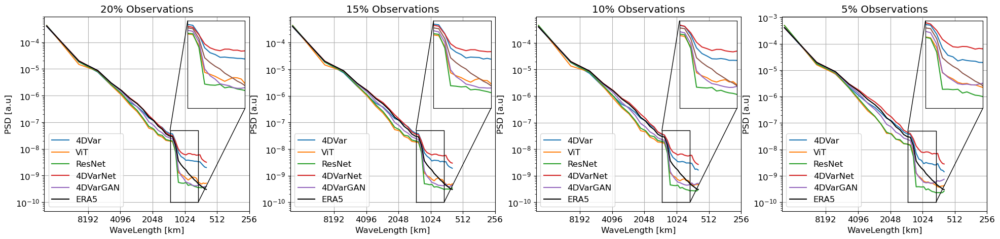

In [82]:
subplot_psd([var4d_psd, vit_psd, resnet_psd, fdvarnet_psd, cgan_psd, era5_psd],
            ['4DVar', 'ViT', 'ResNet', '4DVarNet', '4DVarGAN', 'ERA5'],
            freq, 
            [0.2, 0.15, 0.1, 0.05],  
            fname='PSD_subplot_inittime.pdf')

In [83]:
var4d_dir = '../../output/increment/4dvar'
cgan_dir = '../../output/increment/4dvargan'
resnet_dir = '../../output/increment/resnet'
vit_dir = '../../output/increment/vit'
fdvarnet_dir = '../../output/increment/4dvarnet'

In [84]:
xb_iter_4dvar, xb_iter_3dvar, xb_iter_cgan, xb_iter_cyclegan, xb_iter_unet, xb_iter_4dvarnet, xb_iter_resnet, xb_iter_vit = [], [], [], [], [], [], [], []
fc_iter_4dvar, fc_iter_3dvar, fc_iter_cgan, fc_iter_cyclegan, fc_iter_unet, fc_iter_4dvarnet, fc_iter_resnet, fc_iter_vit = [], [], [], [], [], [], [], []
for obs_partial in [0.2, 0.15, 0.1, 0.05]:#, 0.1]:
    xr_xb_4dvar = xr.open_mfdataset(f'{var4d_dir}/xb_iter_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_4dvar.append(xr_xb_4dvar)
    xr_fc_4dvar = xr.open_mfdataset(f'{var4d_dir}/fc_iter_4dvar_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_4dvar.append(xr_fc_4dvar)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_cgan = xr.open_mfdataset(f'{cgan_dir}/xb_iter_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_cgan.append(xr_xb_cgan)
    xr_fc_cgan = xr.open_mfdataset(f'{cgan_dir}/fc_iter_4dvargan_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_cgan.append(xr_fc_cgan)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/xb_iter_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_4dvarnet.append(xr_xb_4dvarnet)
    xr_fc_4dvarnet = xr.open_mfdataset(f'{fdvarnet_dir}/fc_iter_4dvarnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_4dvarnet.append(xr_fc_4dvarnet)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_resnet = xr.open_mfdataset(f'{resnet_dir}/xb_iter_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_resnet.append(xr_xb_resnet)
    xr_fc_resnet = xr.open_mfdataset(f'{resnet_dir}/fc_iter_resnet_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_resnet.append(xr_fc_resnet)
for obs_partial in [0.2, 0.15, 0.1, 0.05]:
    xr_xb_vit = xr.open_mfdataset(f'{vit_dir}/xb_iter_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    xb_iter_vit.append(xr_xb_vit)
    xr_fc_vit = xr.open_mfdataset(f'{vit_dir}/fc_iter_vit_ensemble1_obserr0.015_obspartial{obs_partial}.nc', combine='by_coords')
    fc_iter_vit.append(xr_fc_vit)

In [171]:
obs_partial = 0.2
obs_single = False
fc_iters = [fc_iter_4dvar[0], fc_iter_vit[0], fc_iter_resnet[0], fc_iter_4dvarnet[0], fc_iter_cgan[0]]
# da_time = 24*np.timedelta64(1, 'h')
time = fc_iters[0]['init_time'][3].values #+ da_time
xb_iters = [xb_iter_4dvar[0], xb_iter_vit[0], xb_iter_resnet[0], xb_iter_4dvarnet[0], xb_iter_cgan[0]]

In [172]:
fc_iters[0], xb_iters[0]

(<xarray.Dataset>
 Dimensions:    (init_time: 7, lead_time: 121, lat: 32, lon: 64)
 Coordinates:
   * init_time  (init_time) datetime64[ns] 2017-01-06 2017-04-16 ... 2018-09-03
   * lead_time  (lead_time) int64 0 6 12 18 24 30 36 ... 690 696 702 708 714 720
   * lat        (lat) float64 -87.19 -81.56 -75.94 -70.31 ... 75.94 81.56 87.19
   * lon        (lon) float64 0.0 5.625 11.25 16.88 ... 337.5 343.1 348.8 354.4
 Data variables:
     z          (lead_time, init_time, lat, lon) float32 dask.array<chunksize=(121, 7, 32, 64), meta=np.ndarray>,
 <xarray.Dataset>
 Dimensions:    (init_time: 7, lead_time: 61, lat: 32, lon: 64)
 Coordinates:
   * init_time  (init_time) datetime64[ns] 2017-01-06 2017-04-16 ... 2018-09-03
   * lead_time  (lead_time) int64 0 12 24 36 48 60 72 ... 660 672 684 696 708 720
   * lat        (lat) float64 -87.19 -81.56 -75.94 -70.31 ... 75.94 81.56 87.19
   * lon        (lon) float64 0.0 5.625 11.25 16.88 ... 337.5 343.1 348.8 354.4
 Data variables:
     z          

/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anac

(None,)

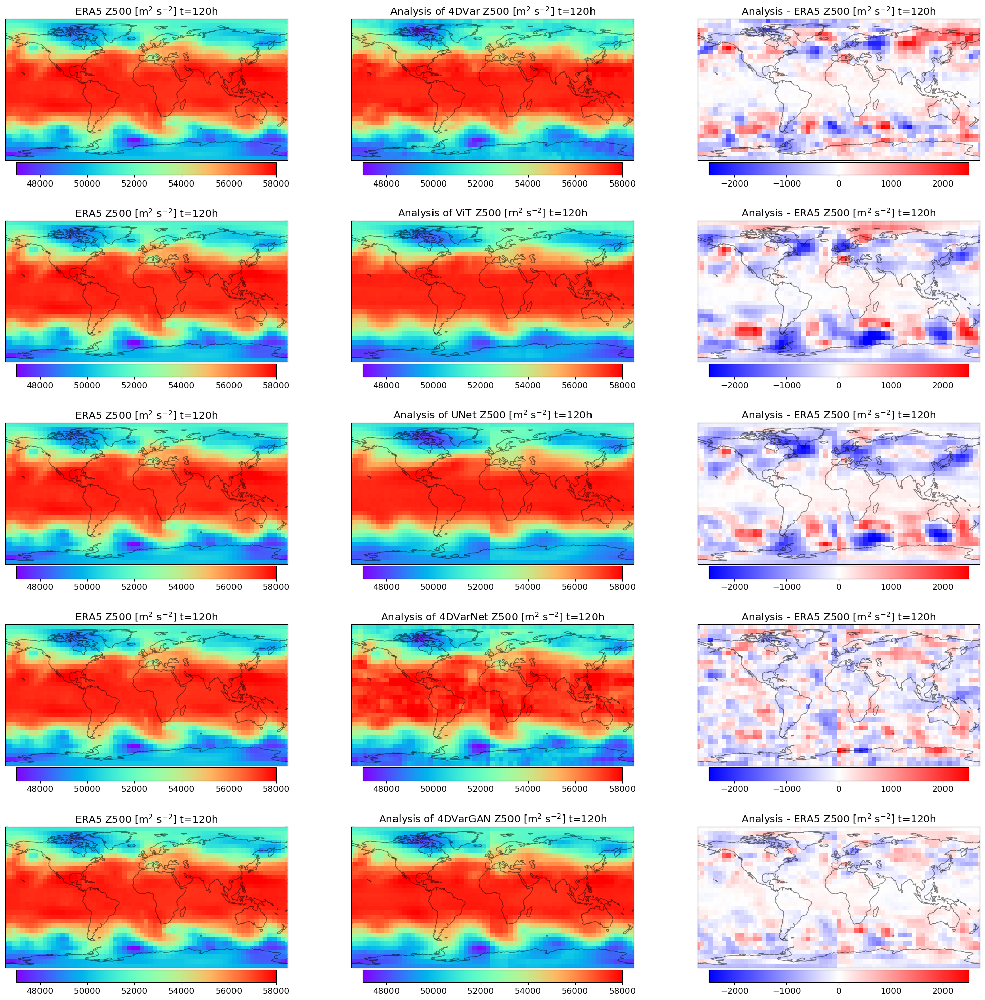

In [173]:
subplot_field(valid,
            xb_iters, 
            fc_iters,
            ['4DVar', 'ViT', 'UNet', '4DVarNet', '4DVarGAN'], 
            f'analysis_field_obs{obs_partial}', 
            time=time + 120*np.timedelta64(1, 'h'), 
            lead_time=120,
            idx=3),

/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anac

(None,)

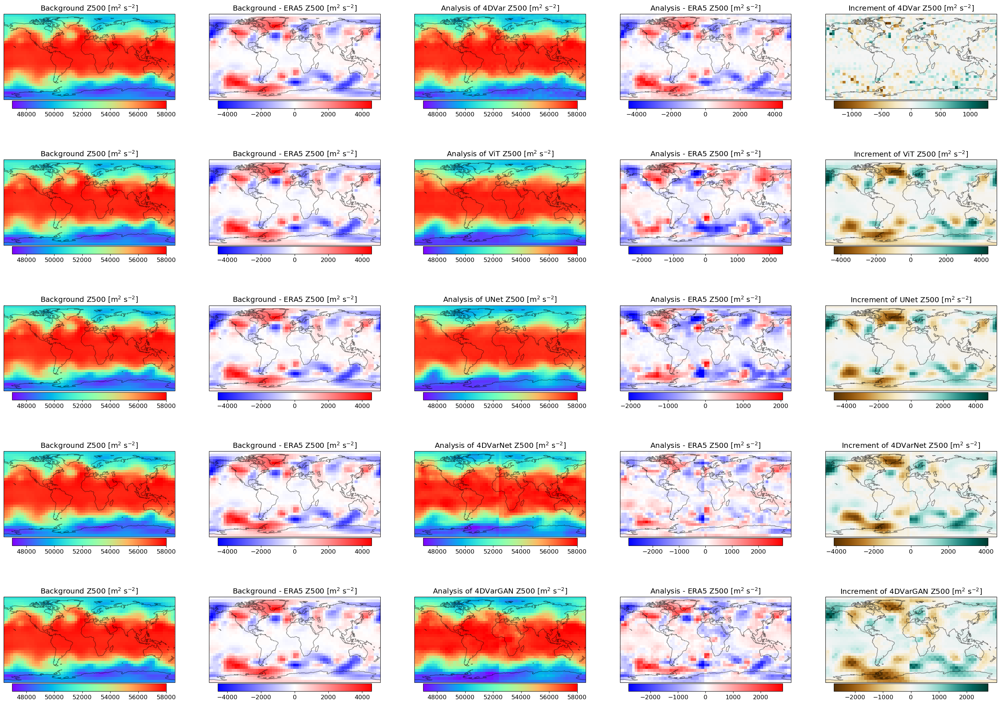

In [174]:
subplot_increment(valid,
                  xb_iters, 
                  fc_iters,
                  ['4DVar', 'ViT', 'UNet', '4DVarNet', '4DVarGAN'], 
                  f'inc_obserr0.015_obs{obs_partial}', 
                  time=time, 
                  lead_time=0,
                  idx=3),

In [126]:
obs_partial = 0.15
obs_single = False
fc_iters = [fc_iter_4dvar[1], fc_iter_vit[1], fc_iter_resnet[1], fc_iter_4dvarnet[1], fc_iter_cgan[1]]
# da_time = 24*np.timedelta64(1, 'h')
time = fc_iters[0]['init_time'][0].values #+ da_time
xb_iters = [xb_iter_4dvar[1], xb_iter_vit[1], xb_iter_resnet[1], xb_iter_4dvarnet[1], xb_iter_cgan[1]]

/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anac

(None,)

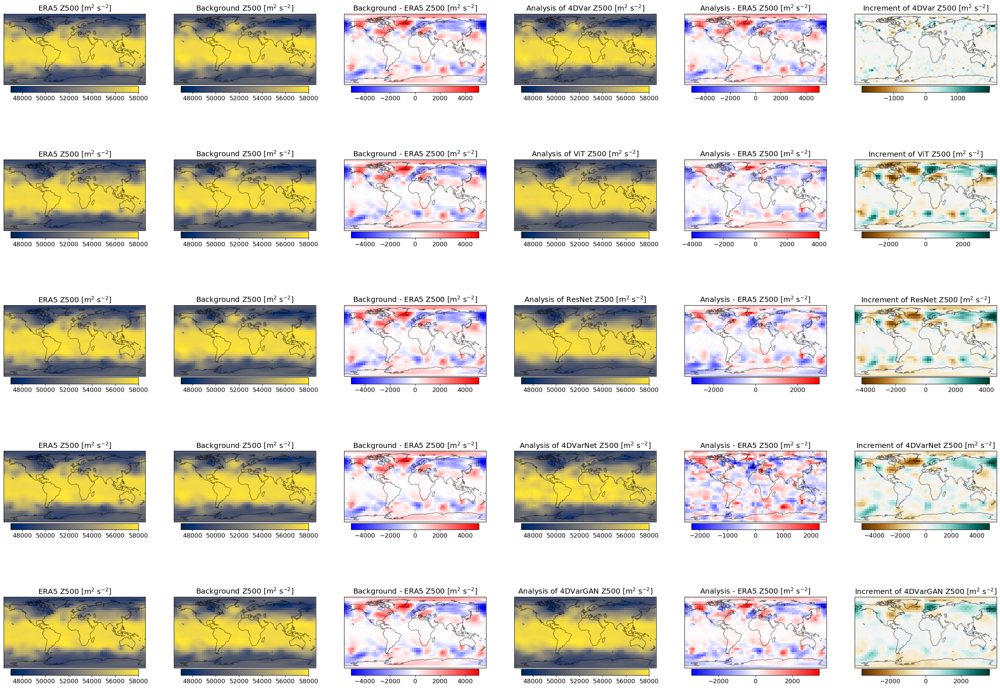

In [127]:
da_time = 24*np.timedelta64(1, 'h')
subplot_increment(valid, 
                  xb_iters, 
                  fc_iters,
                  ['4DVar', 'ViT', 'ResNet', '4DVarNet', '4DVarGAN'], 
                  f'inc_obserr0.015_obs{obs_partial}', 
                  time=time, 
                  lead_time=0,
                  idx=0),

In [128]:
obs_partial = 0.1
obs_single = False
fc_iters = [fc_iter_4dvar[2], fc_iter_vit[2], fc_iter_resnet[2], fc_iter_4dvarnet[2], fc_iter_cgan[2]]
# da_time = 24 * np.timedelta64(1, 'h')
time = fc_iters[0]['init_time'][0].values #+ da_time
xb_iters = [xb_iter_4dvar[2], xb_iter_vit[2], xb_iter_resnet[2], xb_iter_4dvarnet[2], xb_iter_cgan[2]]

/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anac

(None,)

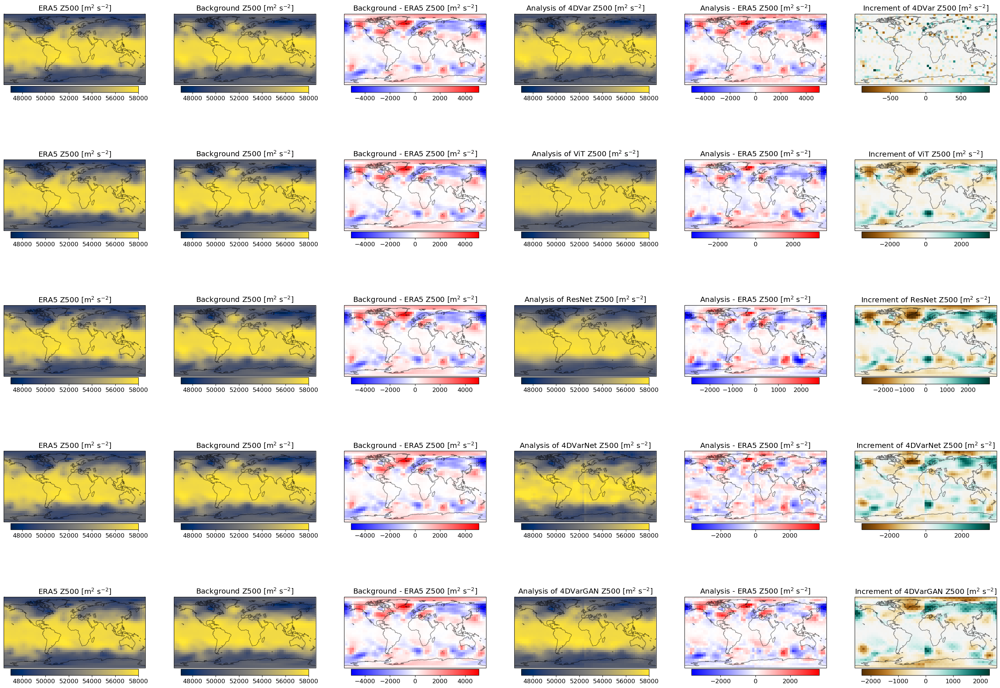

In [120]:
subplot_increment(valid, 
                  xb_iters, 
                  fc_iters,
                  ['4DVar', 'ViT', 'ResNet', '4DVarNet', '4DVarGAN'], 
                  f'inc_obserr0.015_obs{obs_partial}', 
                  time=time, 
                  lead_time=0,
                  idx=0),

In [121]:
obs_partial = 0.05
obs_single = False
fc_iters = [fc_iter_4dvar[3], fc_iter_vit[3], fc_iter_resnet[3], fc_iter_4dvarnet[3], fc_iter_cgan[3]]
# da_time = 24 * np.timedelta64(1, 'h')
time = fc_iters[0]['init_time'][0].values #+ da_time
xb_iters = [xb_iter_4dvar[3], xb_iter_vit[3], xb_iter_resnet[3], xb_iter_4dvarnet[3], xb_iter_cgan[3]]

/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anaconda3/envs/ddwp/lib/python3.8/site-packages/cartopy/crs.py:256: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  line_strings = list(multi_line_string)
/home/wangwx/anac

(None,)

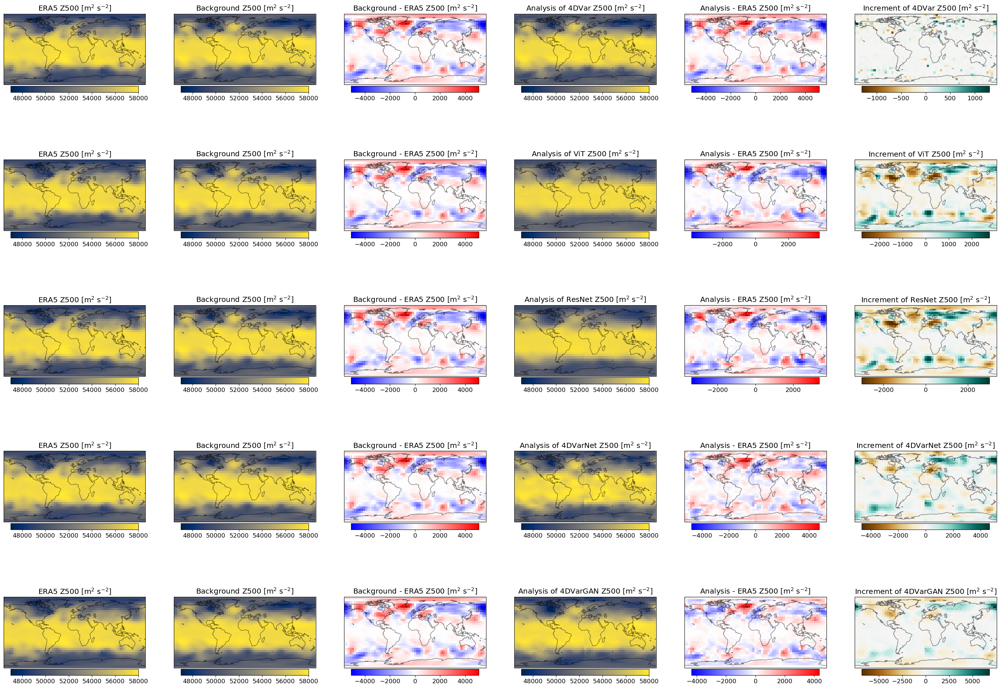

In [122]:
subplot_increment(valid, 
                  xb_iters, 
                  fc_iters,
                  ['4DVar', 'ViT', 'ResNet', '4DVarNet', '4DVarGAN'], 
                  f'inc_obserr0.015_obs{obs_partial}', 
                  time=time, 
                  lead_time=0,
                  idx=0),

In [129]:
# for i in range(len(fc_iter_3dvar)):
#     psd, freq = cvae_compute_mean_spectral_density(fc_iter_3dvar[i].sel(lead_time=120))
#     var3d_psd.append(psd)

In [ ]:
# for i in range(len(fc_iter_cyclegan)):
#     psd, freq = cvae_compute_mean_spectral_density(fc_iter_cyclegan[i].sel(lead_time=24))
#     cyclegan_psd.append(psd)

In [ ]:
# for i in range(len(fc_iter_unet)):
#     psd, freq = cvae_compute_mean_spectral_density(fc_iter_unet[i].sel(lead_time=24))
#     unet_psd.append(psd)

In [ ]:
# subplot_psd([var4d_psd, var3d_psd, cyclegan_psd, cgan_psd, lstm_psd, resnet_psd, vit_psd, era5_psd],
#             ['4DVar', '3DVar', 'CycleGAN', '4DVarGAN', '4DVarNet', 'ResNet', 'ViT', 'ERA5'],
#             freq, 
#             [0.2, 0.15, 0.1, 0.05],  
#             fname='PSD_subplot_inittime.jpg')

In [ ]:
obs_dir = '../../../da_data/observation/'
obs = xr.open_mfdataset(f'{obs_dir}/test/*.nc', combine='by_coords')
obs

In [ ]:
obs_mask_dir = '../../../da_data/observation_mask/'
obs_mask = xr.open_mfdataset(f'{obs_mask_dir}/test/*.nc', combine='by_coords')
obs_mask

In [ ]:
obs_plot = obs * obs_mask
obs_plot = obs_plot.sel(time='2017-01-06T00:00:00.000000000').sel(level=500)['z']
obs_mask_plot = obs_mask.sel(time='2017-01-06T00:00:00.000000000').sel(level=500)['z']
obs_plot_points = np.nonzero(obs_plot.values)
obs_plot_points[0], obs_plot_points[1]
obs_mask_plot

In [ ]:
import cartopy.crs as ccrs
fig, ax = plt.subplots(1, 1, figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
ax.scatter(obs_mask['lon'].values[obs_plot_points[1]], obs_mask['lat'].values[obs_plot_points[0]], s=3, transform=ccrs.PlateCarree())
plt.show()